<a href="https://colab.research.google.com/github/yestrella14/DS-Unit-2-Kaggle-Challenge/blob/master/LS_DS_221_assignment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Lambda School Data Science

*Unit 2, Sprint 2, Module 1*

---

# Decision Trees

## Assignment
- [ ] [Sign up for a Kaggle account](https://www.kaggle.com/), if you don’t already have one. Go to our Kaggle InClass competition website. You will be given the URL in Slack. Go to the Rules page. Accept the rules of the competition. Notice that the Rules page also has instructions for the Submission process. The Data page has feature definitions.
- [ ] Do train/validate/test split with the Tanzania Waterpumps data.
- [ ] Begin with baselines for classification.
- [ ] Select features. Use a scikit-learn pipeline to encode categoricals, impute missing values, and fit a decision tree classifier.
- [ ] Get your validation accuracy score.
- [ ] Get and plot your feature importances.
- [ ] Submit your predictions to our Kaggle competition. (Go to our Kaggle InClass competition webpage. Use the blue **Submit Predictions** button to upload your CSV file. Or you can use the Kaggle API to submit your predictions.)
- [ ] Commit your notebook to your fork of the GitHub repo.


## Stretch Goals

### Reading

- A Visual Introduction to Machine Learning
  - [Part 1: A Decision Tree](http://www.r2d3.us/visual-intro-to-machine-learning-part-1/)
  - [Part 2: Bias and Variance](http://www.r2d3.us/visual-intro-to-machine-learning-part-2/)
- [Decision Trees: Advantages & Disadvantages](https://christophm.github.io/interpretable-ml-book/tree.html#advantages-2)
- [How a Russian mathematician constructed a decision tree — by hand — to solve a medical problem](http://fastml.com/how-a-russian-mathematician-constructed-a-decision-tree-by-hand-to-solve-a-medical-problem/)
- [How decision trees work](https://brohrer.github.io/how_decision_trees_work.html)
- [Let’s Write a Decision Tree Classifier from Scratch](https://www.youtube.com/watch?v=LDRbO9a6XPU) — _Don’t worry about understanding the code, just get introduced to the concepts. This 10 minute video has excellent diagrams and explanations._
- [Random Forests for Complete Beginners: The definitive guide to Random Forests and Decision Trees](https://victorzhou.com/blog/intro-to-random-forests/)


### Doing
- [ ] Add your own stretch goal(s) !
- [ ] Define a function to wrangle train, validate, and test sets in the same way. Clean outliers and engineer features. (For example, [what columns have zeros and shouldn't?](https://github.com/Quartz/bad-data-guide#zeros-replace-missing-values) What columns are duplicates, or nearly duplicates? Can you extract the year from date_recorded? Can you engineer new features, such as the number of years from waterpump construction to waterpump inspection?)
- [ ] Try other [scikit-learn imputers](https://scikit-learn.org/stable/modules/impute.html).
- [ ] Make exploratory visualizations and share on Slack.


#### Exploratory visualizations

Visualize the relationships between feature(s) and target. I recommend you do this with your training set, after splitting your data. 

For this problem, you may want to create a new column to represent the target as a number, 0 or 1. For example:

```python
train['functional'] = (train['status_group']=='functional').astype(int)
```



You can try [Seaborn "Categorical estimate" plots](https://seaborn.pydata.org/tutorial/categorical.html) for features with reasonably few unique values. (With too many unique values, the plot is unreadable.)

- Categorical features. (If there are too many unique values, you can replace less frequent values with "OTHER.")
- Numeric features. (If there are too many unique values, you can [bin with pandas cut / qcut functions](https://pandas.pydata.org/pandas-docs/stable/getting_started/basics.html?highlight=qcut#discretization-and-quantiling).)

You can try [Seaborn linear model plots](https://seaborn.pydata.org/tutorial/regression.html) with numeric features. For this classification problem, you may want to use the parameter `logistic=True`, but it can be slow.

You do _not_ need to use Seaborn, but it's nice because it includes confidence intervals to visualize uncertainty.

#### High-cardinality categoricals

This code from a previous assignment demonstrates how to replace less frequent values with 'OTHER'

```python
# Reduce cardinality for NEIGHBORHOOD feature ...

# Get a list of the top 10 neighborhoods
top10 = train['NEIGHBORHOOD'].value_counts()[:10].index

# At locations where the neighborhood is NOT in the top 10,
# replace the neighborhood with 'OTHER'
train.loc[~train['NEIGHBORHOOD'].isin(top10), 'NEIGHBORHOOD'] = 'OTHER'
test.loc[~test['NEIGHBORHOOD'].isin(top10), 'NEIGHBORHOOD'] = 'OTHER'
```


In [2]:
import sys

# If you're on Colab:
if 'google.colab' in sys.modules:
    DATA_PATH = 'https://raw.githubusercontent.com/LambdaSchool/DS-Unit-2-Kaggle-Challenge/master/data/'
    !pip install category_encoders==2.*
    !pip install pandas-profiling==2.*

# If you're working locally:
else:
    DATA_PATH = '../data/'

In [3]:
import pandas as pd
from sklearn.model_selection import train_test_split

train = pd.merge(pd.read_csv(DATA_PATH+'waterpumps/train_features.csv'), 
                 pd.read_csv(DATA_PATH+'waterpumps/train_labels.csv'))
test = pd.read_csv(DATA_PATH+'waterpumps/test_features.csv')
sample_submission = pd.read_csv(DATA_PATH+'waterpumps/sample_submission.csv')

train.shape, test.shape

((59400, 41), (14358, 40))

In [4]:
from pandas_profiling import ProfileReport
profile = ProfileReport(train, minimal=True).to_notebook_iframe()

profile

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [55]:
#Split Train into train and Val

train, val = train_test_split(train, train_size=0.8, test_size=0.2, 
                              stratify=train['status_group'], random_state=42)
train.shape, val.shape

((35640, 40), (8910, 40))

In [56]:
val['status_group'].value_counts(normalize=True)

functional                0.54310
non functional            0.38429
functional needs repair   0.07262
Name: status_group, dtype: float64

In [57]:
train.describe(include='all')

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
count,"35,640.00000","35,640.00000",35640,33475,"35,640.00000",33450,"34,543.00000","34,543.00000",35640,"35,640.00000",35640,35414,35640,"35,640.00000","35,640.00000",35640,35640,"35,640.00000",33667,35640,33310,18744,33811,"35,640.00000",35640,35640,35640,35640,35640,35640,35640,35640,35640,35640,35640,35640,35640,35640,35640,35640
unique,nan,nan,5,1477,nan,1634,nan,nan,23781,nan,9,14680,21,nan,nan,124,2069,nan,2,1,12,2336,2,nan,17,13,7,12,5,7,7,8,6,5,10,7,3,7,6,3
top,nan,nan,2011,Government Of Tanzania,nan,DWE,nan,nan,none,nan,Lake Victoria,Majengo,Iringa,nan,nan,Njombe,Igosi,nan,True,GeoData Consultants Ltd,VWC,K,True,nan,gravity,gravity,gravity,vwc,user-group,never pay,never pay,soft,good,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
freq,nan,nan,17204,5449,nan,10387,nan,nan,2133,nan,6096,309,3215,nan,nan,1532,188,nan,30694,35640,22036,421,23281,nan,16190,16190,16190,24295,31469,15257,15257,30473,30473,19924,10266,10266,27433,17160,20841,19355
mean,"37,131.66580",303.74144,NaN,NaN,671.31086,NaN,35.16676,-5.89019,NaN,0.46857,NaN,NaN,NaN,15.27668,5.68246,NaN,NaN,181.20710,NaN,NaN,NaN,NaN,NaN,"1,306.02823",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,"21,484.73376","2,383.40009",NaN,NaN,694.07667,NaN,2.60488,2.80821,NaN,12.28022,NaN,NaN,NaN,17.59935,9.72479,NaN,NaN,488.04040,NaN,NaN,NaN,NaN,NaN,949.93407,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,0.00000,0.00000,NaN,NaN,-90.00000,NaN,29.60720,-11.64944,NaN,0.00000,NaN,NaN,NaN,1.00000,0.00000,NaN,NaN,0.00000,NaN,NaN,NaN,NaN,NaN,0.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,"18,402.75000",0.00000,NaN,NaN,0.00000,NaN,33.30907,-8.65176,NaN,0.00000,NaN,NaN,NaN,5.00000,2.00000,NaN,NaN,0.00000,NaN,NaN,NaN,NaN,NaN,0.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,"37,045.00000",0.00000,NaN,NaN,375.00000,NaN,35.03950,-5.16933,NaN,0.00000,NaN,NaN,NaN,12.00000,3.00000,NaN,NaN,30.00000,NaN,NaN,NaN,NaN,NaN,"1,986.00000",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,"55,733.75000",20.00000,NaN,NaN,"1,323.00000",NaN,37.23938,-3.37629,NaN,0.00000,NaN,NaN,NaN,17.00000,5.00000,NaN,NaN,215.00000,NaN,NaN,NaN,NaN,NaN,"2,004.00000",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [58]:
#For plotting

def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''<script src="/static/components/requirejs/require.js"></script>'''))
  init_notebook_mode(connected=False)

In [59]:
enable_plotly_in_cell()
import plotly.express as px
px.scatter(train, x='longitude', y='latitude', color='status_group', opacity=0.3)

In [60]:
pd.options.display.float_format = "{:,.5f}".format
latitude = train[train['longitude']==0]
latitude

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group


In [61]:
import numpy as np

def wrangle(X):
  """Wrangle Train, Validate and test sets in the same way"""

  #prevent setting with copy
  X=X.copy()

  #lets treat the latitude with value almost zero to be equal to zero
  X['latitude'] = X['latitude'].replace(-2e-08, 0)

  #Replace 0s with null and inpute later
  cols_with_zeros=['longitude', 'latitude']
  for col in cols_with_zeros:
    X[col] =X[col].replace(0, np.nan)

  #Drop the duplicated quanty_group column
  X = X.drop(columns='quantity_group')

  return X




In [62]:
train = wrangle(train)
train.head(2)

KeyError: ignored

In [63]:
enable_plotly_in_cell()
import plotly.express as px
px.scatter(train, x='longitude', y='latitude', color='status_group', opacity=0.3)

In [64]:
# enable_plotly_in_cell()
# figure = px.scatter_mapbox(train, lat='latitude', lon='longitude', color='status_group', opacity=0.2)
# figure.update_layout(mapbox_style='stamen-terrain')
# figure.show()

In [65]:
#Can we convert some columns to lower cardinality?

train['date_recorded'].value_counts()

2011    17204
2013    14577
2012     3841
2004       17
2002        1
Name: date_recorded, dtype: int64

In [66]:
# #lets convert date_recorde to date time only with month and year
train['date_recorded'] = pd.to_datetime(train['date_recorded'], infer_datetime_format=True).dt.to_period('Y')
val['date_recorded'] = pd.to_datetime(val['date_recorded'], infer_datetime_format=True).dt.to_period('M')
test['date_recorded'] = pd.to_datetime(test['date_recorded'], infer_datetime_format=True).dt.to_period('M')

In [67]:
# # #Do the same for test and val
# val['date_recorded'] = pd.to_datetime(val['date_recorded'], infer_datetime_format=True).dt.to_period('M')
# test['date_recorded'] = pd.to_datetime(test['date_recorded'], infer_datetime_format=True).dt.to_period('M')

In [68]:
# #now to string
train['date_recorded'] = train['date_recorded'].astype(str)
val['date_recorded'] = val['date_recorded'].astype(str)
test['date_recorded'] = test['date_recorded'].astype(str)

In [19]:
# train.describe(include='all')

In [69]:
train['ward'].value_counts().tail(80)

Luwalaje           1
Misunkumilo        1
Ilula              1
Nyanungu           1
Uwanja wa Ndege    1
                  ..
Izia               1
Olbolot            1
Kakesio            1
Kitembe            1
Baraa              1
Name: ward, Length: 80, dtype: int64

In [70]:
train['installer'].value_counts().tail(20)

mzee mabena                1
ELCA                       1
BUMABU                     1
CH                         1
TWESA/Community            1
Swalehe Rajabu             1
DWE/Ubalozi wa Marekani    1
ISSAC MOLLEl               1
EGYPT                      1
GRUMET                     1
muniko                     1
Gerald Mila                1
TANCAN                     1
QUICKWINS                  1
Ambrose                    1
Conta                      1
Ubalozi wa Japani          1
Water Authority            1
COMMUNITY BANK             1
P.N.R.                     1
Name: installer, dtype: int64

In [22]:
# train['ward'] = train['ward'].replace(train['ward'].value_counts()<=1, 'Other')
# train['ward'].value_counts().tail(20)

In [23]:
# train['ward'].value_counts().tail(20)

In [24]:
# condition = train['ward'].value_counts()==1


# names =train['ward'].value_counts()==1
# names.value_counts()

# train['ward'] = train['ward'].replace(names==True, 'Other')
# train['ward'].value_counts().head(30)

In [71]:
target = 'status_group'

# get the df with train columns except the target & id
train_features = train.drop(columns=[target, 'id'])

# only numeric features
numeric_features = train_features.select_dtypes(include='number').columns.tolist()

# cardinality of the nonnumeric features
cardinality = train_features.select_dtypes(exclude='number').nunique()

#categorical features with cardinality <= 50
categorical_features = cardinality[cardinality <= 40].index.tolist()

features = numeric_features + categorical_features
print(features)

['amount_tsh', 'gps_height', 'longitude', 'latitude', 'num_private', 'region_code', 'district_code', 'population', 'construction_year', 'date_recorded', 'basin', 'region', 'public_meeting', 'recorded_by', 'scheme_management', 'permit', 'extraction_type', 'extraction_type_group', 'extraction_type_class', 'management', 'management_group', 'payment', 'payment_type', 'water_quality', 'quality_group', 'quantity', 'source', 'source_type', 'source_class', 'waterpoint_type', 'waterpoint_type_group']


In [72]:
X_train = train[features]
y_train = train[target]
X_val = val[features]
y_val = val[target]
X_test = test[features]

In [73]:
import category_encoders as ce
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

pipeline = make_pipeline(
    ce.OneHotEncoder(use_cat_names=True), 
    SimpleImputer(strategy='mean'), 
    StandardScaler(), 
    LogisticRegression(multi_class='auto', solver='lbfgs', n_jobs=-1)
)

# Fit on train
pipeline.fit(X_train, y_train)

# Score on val
print('Validation Accuracy', pipeline.score(X_val, y_val))

# Predict on test
y_pred = pipeline.predict(X_test)

Validation Accuracy 0.7303030303030303


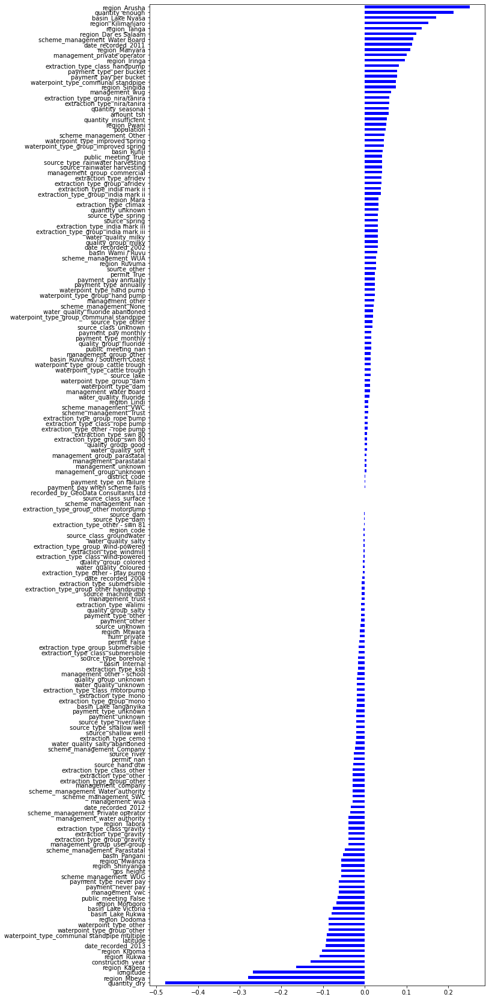

In [74]:
%matplotlib inline
import matplotlib.pyplot as plt

model = pipeline.named_steps['logisticregression']

encoder = pipeline.named_steps['onehotencoder']
encoded_columns = encoder.transform(X_val).columns
coefficients = pd.Series(model.coef_[0], encoded_columns)
plt.figure(figsize=(10,30))
coefficients.sort_values().plot.barh(color='blue');

In [75]:
from sklearn.tree import DecisionTreeClassifier
pipeline = make_pipeline(
    ce.OneHotEncoder(use_cat_names=True), 
    SimpleImputer(strategy='mean'), 
    DecisionTreeClassifier(random_state=42, max_depth=28, min_samples_leaf=18)
)

# Fit train
pipeline.fit(X_train, y_train)

print('Train Acuracy', pipeline.score(X_train, y_train))
print('Validation Accuracy', pipeline.score(X_val, y_val))

# Predict on test
y_pred = pipeline.predict(X_test)

Train Acuracy 0.8061728395061728
Validation Accuracy 0.7615039281705949


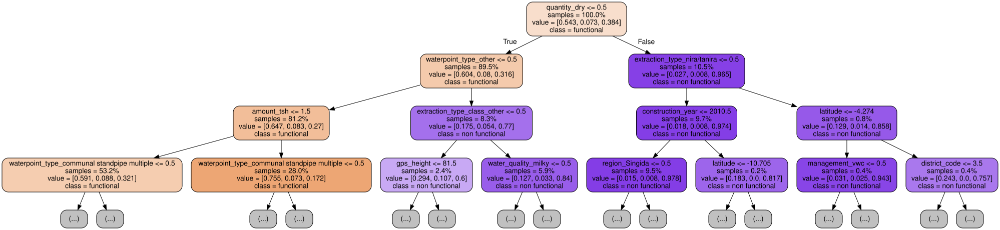

In [76]:
# Plot tree
# https://scikit-learn.org/stable/modules/generated/sklearn.tree.export_graphviz.html
import graphviz
from sklearn.tree import export_graphviz

model = pipeline.named_steps['decisiontreeclassifier']
encoder = pipeline.named_steps['onehotencoder']
encoded_columns = encoder.transform(X_val).columns

dot_data = export_graphviz(model, 
                           out_file=None, 
                           max_depth=3, 
                           feature_names=encoded_columns,
                           class_names=model.classes_, 
                           impurity=False, 
                           filled=True, 
                           proportion=True, 
                           rounded=True)   
display(graphviz.Source(dot_data))

In [77]:
y_pred.shape, X_test.shape

((14358,), (14358, 31))

In [78]:
my_submission = pd.DataFrame(y_pred, columns=['status_group'])
my_submission['id']=test.index
my_submission= my_submission[['id', 'status_group']]
my_submission.head()

,id,status_group
0,0,non functional
1,1,functional
2,2,functional
3,3,non functional
4,4,functional


In [79]:
my_submission

,id,status_group
0,0,non functional
1,1,functional
2,2,functional
3,3,non functional
4,4,functional
...,...,...
14353,14353,non functional
14354,14354,functional
14355,14355,functional
14356,14356,functional


In [80]:
my_submission.to_csv('YeraldinaSubmission',index=False)
my_submission

,id,status_group
0,0,non functional
1,1,functional
2,2,functional
3,3,non functional
4,4,functional
...,...,...
14353,14353,non functional
14354,14354,functional
14355,14355,functional
14356,14356,functional
